map

In [1]:
import os
os.environ["SCIPY_ARRAY_API"] = "1"
import sys
import scanpy as sc
import numpy as np
import pandas as pd
import scarches as sca
import scvi
import anndata as ad
from scipy import sparse
import gdown
import gzip
import shutil
import urllib.request
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42

 captum (see https://github.com/pytorch/captum).


In [2]:
ref_model_dir_prefix = "/disk212/yupf/database/scRNA-seq/NewAtlas/IPGCA_Extend"  # directory in which to store the reference model directory
surgery_model_dir_prefix = (
    "/disk212/yupf/database/scRNA-seq/NewAtlas/IPGCA_Extend"  # directory in which to store the surgery model directory
)
path_reference_emb = (
    "/disk212/yupf/database/scRNA-seq/NewAtlas/atlas_level3_v2.h5ad"  # path to reference embedding to be created
)
path_surgery_embs=(
    "/disk212/yupf/database/scRNA-seq/NewAtlas/IPGCA_Extend/surgery_h5ad"  # path to reference embedding to be created
)
path_query_data = "./IPGCA_extend_celltypist.h5ad"  # input test query data
# don't change the following paths:
ref_model_dir = os.path.join(
    ref_model_dir_prefix, "IPGCA_reference_model"
)  # don't change this
surgery_model_dir = os.path.join(
    surgery_model_dir_prefix, "surgery_model"
)  # don't change this

In [3]:
core=sc.read_h5ad(path_reference_emb)
core.raw=core

In [4]:
core = sca.models.SCANVI.prepare_query_anndata(
    adata=core, reference_model=ref_model_dir, inplace=False
)

INFO     File /disk212/yupf/database/scRNA-seq/NewAtlas/IPGCA_Extend/IPGCA_reference_model/model.pt already        
         downloaded                                                                                                
INFO     Found 100.0% reference vars in query data.                                                                


In [5]:
core.obs["ref_or_query"] = "ref"
core.obsm['X_scanvi_emb']=core.obsm['X_scVI']

In [6]:
adata_query=sc.read_h5ad('/disk212/yupf/database/scRNA-seq/NewAtlas/IPGCA_Extend/IPGCA_extend_celltypist.h5ad')

In [7]:
extend_meta=pd.read_csv('/disk212/yupf/database/scRNA-seq/NewAtlas/IPGCA_Extend/Extend_meta.txt',sep='\t')

In [8]:
df2=adata_query.obs.copy()
df1=extend_meta
merged_df = df2.merge(df1, left_on='project', right_on='Dataset', how='left')
merged_df.index=adata_query.obs.index

In [9]:
merged_df

,doublet_score,predicted_doublet,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,project,S_score,G2M_score,...,stage,age,weaned,disease,gender,region,breed,platform,sequence_method,Project
AAACCCAAGCTGCCAC-1_CRR1248479_GF_MLN,0.042017,False,3061,3061,11969.0,257.0,2.147213,CRR1248479_GF_MLN,0.014916,-0.142133,...,Weaner,42d,after,Mesenteric lymph node,NaN,SmallInt,Bama,10x Genomics,scRNA-seq,CRA018161
AAACCCAAGGCACGAT-1_CRR1248479_GF_MLN,0.062536,False,3246,3246,12306.0,273.0,2.218430,CRR1248479_GF_MLN,-0.029017,-0.056628,...,Weaner,42d,after,Mesenteric lymph node,NaN,SmallInt,Bama,10x Genomics,scRNA-seq,CRA018161
AAACCCACACCCTCTA-1_CRR1248479_GF_MLN,0.032307,False,387,387,543.0,17.0,3.130755,CRR1248479_GF_MLN,-0.060636,-0.053832,...,Weaner,42d,after,Mesenteric lymph node,NaN,SmallInt,Bama,10x Genomics,scRNA-seq,CRA018161
AAACCCACACCTCTAC-1_CRR1248479_GF_MLN,0.086672,False,1447,1447,2389.0,66.0,2.762662,CRR1248479_GF_MLN,0.031442,-0.124349,...,Weaner,42d,after,Mesenteric lymph node,NaN,SmallInt,Bama,10x Genomics,scRNA-seq,CRA018161
AAACCCACACGATTCA-1_CRR1248479_GF_MLN,0.046853,False,2944,2944,10104.0,208.0,2.058591,CRR1248479_GF_MLN,-0.062420,-0.196795,...,Weaner,42d,after,Mesenteric lymph node,NaN,SmallInt,Bama,10x Genomics,scRNA-seq,CRA018161
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ACCACGATTGCCATTCCGAGTATG_CRR773959_M790,0.113703,False,3377,3369,15815.0,0.0,0.000000,CRR773959_M790,0.337210,0.388917,...,Adult,790d,after,NaN,Male,LargeInt,Bama,SeekOne,scRNA-seq,CRA010843
ATGCCTGTCTAGGTGATCTGAGAG_CRR773959_M790,0.057031,False,2946,2944,16028.0,0.0,0.000000,CRR773959_M790,-0.006486,0.263362,...,Adult,790d,after,NaN,Male,LargeInt,Bama,SeekOne,scRNA-seq,CRA010843
AGCACTTCCTATCGCATTGACAGG_CRR773959_M790,0.041563,False,3291,3289,17955.0,0.0,0.000000,CRR773959_M790,-0.097278,-0.127935,...,Adult,790d,after,NaN,Male,LargeInt,Bama,SeekOne,scRNA-seq,CRA010843
TGGCATGTCGTTATGCCTTCGTTC_CRR773959_M790,0.046388,False,3387,3382,19341.0,0.0,0.000000,CRR773959_M790,-0.093603,-0.113225,...,Adult,790d,after,NaN,Male,LargeInt,Bama,SeekOne,scRNA-seq,CRA010843


In [10]:
adata_query.obs=merged_df

In [11]:
adata_query.obs['Project'].unique()

array(['CRA018161', 'PRJNA802582', 'PRJNA907920', 'PRJNA970265',
       'PRJNA1246084', 'PRJNA975751', 'CRA010843'], dtype=object)

In [ ]:
adata_query.obs["CellType"]='unknown'

In [13]:
adata_query

AnnData object with n_obs × n_vars = 616557 × 25238
    obs: 'doublet_score', 'predicted_doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'project', 'S_score', 'G2M_score', 'phase', '_scvi_batch', '_scvi_labels', 'leiden', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'leiden_1.0', 'Dataset', 'segment', 'stage', 'age', 'weaned', 'disease', 'gender', 'region', 'breed', 'platform', 'sequence_method', 'Project', 'CellType'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'hvg', 'leiden', 'leiden_1.0', 'leiden_1.0_colors', 'leiden_colors', 'log1p', 'majority_voting_colors', 'neighbors', 'pca', 'predicted_labels_colors', 'project_colors', 'umap'
    obsm: 'X_pca', 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs'
    obsp: 'connectivities', 'distances'

In [14]:
SemiSupervised_kwargs_surgery = {
    # "early_stopping_metric": "elbo",
    # "save_best_state_metric": "elbo",
    # "on": "full_dataset",
    # "patience": 10,
    # "threshold": 0.001,
    "reduce_lr_on_plateau": True,
    "lr_patience": 8,
    "lr_factor": 0.1,
}
surgery_epochs = 500

early_stopping_kwargs_scanvi = {
    "early_stopping": True,  # 启用早停机制
    "early_stopping_monitor": "elbo_validation",  # 监控的指标
    "early_stopping_min_delta": 0.001,  # 最小改进阈值
    "early_stopping_patience": 10,  # 耐心值
    "early_stopping_mode": "min",  # 模式（因为 ELBO 是越小越好）
    "early_stopping_warmup_epochs": 0,  # 热身周期
}

In [ ]:
latent_ap={}
query_ap={}
knn_transformer = sca.utils.knn.weighted_knn_trainer(
    train_adata=core,
    train_adata_emb="X",  # location of our joint embedding
    n_neighbors=50,
)

Weighted KNN with n_neighbors = 50 ... 

In [16]:
for i in  adata_query.obs['Project'].unique():
    dataset=i
    surgery_path=f'{surgery_model_dir}/{dataset}'
    query_ap[dataset] = adata_query[adata_query.obs.Project == dataset,:].copy()
    query_ap[dataset].raw = query_ap[dataset]
    query_ap[dataset] = sca.models.SCANVI.prepare_query_anndata(
        adata=query_ap[dataset], reference_model=ref_model_dir, inplace=False)
    model = sca.models.SCANVI.load_query_data(
    query_ap[dataset],
    ref_model_dir,
    freeze_dropout = True)
    # now train surgery model using reference model and query adata
    model.train(
        max_epochs=surgery_epochs,
        check_val_every_n_epoch=1,
        plan_kwargs=SemiSupervised_kwargs_surgery,
        **early_stopping_kwargs_scanvi,
        # train_base_model=False
    )
    if not os.path.exists(surgery_path):
        os.makedirs(surgery_path)
    model.save(surgery_path, overwrite=True)
    latent_ap[dataset] = sc.AnnData(model.get_latent_representation(query_ap[dataset]))
    latent_ap[dataset].obs.index = query_ap[dataset].obs.index
    query_ap[dataset].obsm['X_scanvi_emb'] = latent_ap[dataset][query_ap[dataset].obs.index,:].X
    query_ap[dataset].obs["ref_or_query"] = "query"
    ### label trans
    labels, uncert = sca.utils.knn.weighted_knn_transfer(
    query_adata=query_ap[dataset],
    query_adata_emb="X",  # location of our embedding, query_adata.X in this case
    label_keys="CellType",  # (start of) obs column name(s) for which to transfer labels
    knn_model=knn_transformer,
    ref_adata_obs=core.obs,
    )
    ### rename
    labels.rename(
    columns={
        f"CellType": f"CellType_transferred"
    },
    inplace=True,
    )
    uncert.rename(
        columns={
            f"CellType": f"CellType_transferred_uncert"
        },
        inplace=True,
    )
    query_ap[dataset].obs=query_ap[dataset].obs.join(labels)
    query_ap[dataset].obs = query_ap[dataset].obs.join(uncert)
    uncertainty_threshold=0.5
    query_ap[dataset].obs[f"CellType"] = query_ap[dataset].obs[
        f"CellType_transferred"
    ].mask(
        query_ap[dataset].obs[f"CellType_transferred_uncert"] > uncertainty_threshold,
        "unknown",
    )

INFO     File /disk212/yupf/database/scRNA-seq/NewAtlas/IPGCA_Extend/IPGCA_reference_model/model.pt already        
         downloaded                                                                                                
INFO     Found 100.0% reference vars in query data.                                                                


INFO: Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
INFO:lightning.pytorch.utilities.rank_zero:Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.


INFO     File /disk212/yupf/database/scRNA-seq/NewAtlas/IPGCA_Extend/IPGCA_reference_model/model.pt already        
         downloaded                                                                                                


/disk221/software/miniconda3/envs/labBase/lib/python3.11/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /disk221/software/miniconda3/envs/labBase/lib/python ...


INFO     Training for 500 epochs.                                                                                  


/disk221/software/miniconda3/envs/labBase/lib/python3.11/site-packages/scvi/data/fields/_base_field.py:63: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
INFO: Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
INFO:lightning.pytorch.utilities.rank_zero:Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
/disk221/software/miniconda3/envs/labBase/lib/python3.11/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available o

Training:   0%|          | 0/500 [00:00<?, ?it/s]

Monitored metric elbo_validation did not improve in the last 10 records. Best score: 1123.614. Signaling Trainer to stop.
finished!
INFO     File /disk212/yupf/database/scRNA-seq/NewAtlas/IPGCA_Extend/IPGCA_reference_model/model.pt already        
         downloaded                                                                                                
INFO     Found 100.0% reference vars in query data.                                                                


INFO: Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
INFO:lightning.pytorch.utilities.rank_zero:Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.


INFO     File /disk212/yupf/database/scRNA-seq/NewAtlas/IPGCA_Extend/IPGCA_reference_model/model.pt already        
         downloaded                                                                                                


/disk221/software/miniconda3/envs/labBase/lib/python3.11/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /disk221/software/miniconda3/envs/labBase/lib/python ...
/disk221/software/miniconda3/envs/labBase/lib/python3.11/site-packages/scvi/data/fields/_base_field.py:63: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)


INFO     Training for 500 epochs.                                                                                  


INFO: Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
INFO:lightning.pytorch.utilities.rank_zero:Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
/disk221/software/miniconda3/envs/labBase/lib/python3.11/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /disk221/software/miniconda3/envs/labBase/lib/python ...
INFO: GPU available: True (cuda)

Training:   0%|          | 0/500 [00:00<?, ?it/s]

Monitored metric elbo_validation did not improve in the last 10 records. Best score: 903.574. Signaling Trainer to stop.
finished!
INFO     File /disk212/yupf/database/scRNA-seq/NewAtlas/IPGCA_Extend/IPGCA_reference_model/model.pt already        
         downloaded                                                                                                
INFO     Found 100.0% reference vars in query data.                                                                


INFO: Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
INFO:lightning.pytorch.utilities.rank_zero:Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.


INFO     File /disk212/yupf/database/scRNA-seq/NewAtlas/IPGCA_Extend/IPGCA_reference_model/model.pt already        
         downloaded                                                                                                


/disk221/software/miniconda3/envs/labBase/lib/python3.11/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /disk221/software/miniconda3/envs/labBase/lib/python ...
/disk221/software/miniconda3/envs/labBase/lib/python3.11/site-packages/scvi/data/fields/_base_field.py:63: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)


INFO     Training for 500 epochs.                                                                                  


INFO: Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
INFO:lightning.pytorch.utilities.rank_zero:Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
/disk221/software/miniconda3/envs/labBase/lib/python3.11/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /disk221/software/miniconda3/envs/labBase/lib/python ...
INFO: GPU available: True (cuda)

Training:   0%|          | 0/500 [00:00<?, ?it/s]

Monitored metric elbo_validation did not improve in the last 10 records. Best score: 1186.235. Signaling Trainer to stop.
finished!
INFO     File /disk212/yupf/database/scRNA-seq/NewAtlas/IPGCA_Extend/IPGCA_reference_model/model.pt already        
         downloaded                                                                                                
INFO     Found 100.0% reference vars in query data.                                                                


INFO: Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
INFO:lightning.pytorch.utilities.rank_zero:Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.


INFO     File /disk212/yupf/database/scRNA-seq/NewAtlas/IPGCA_Extend/IPGCA_reference_model/model.pt already        
         downloaded                                                                                                


/disk221/software/miniconda3/envs/labBase/lib/python3.11/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /disk221/software/miniconda3/envs/labBase/lib/python ...
/disk221/software/miniconda3/envs/labBase/lib/python3.11/site-packages/scvi/data/fields/_base_field.py:63: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)


INFO     Training for 500 epochs.                                                                                  


INFO: Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
INFO:lightning.pytorch.utilities.rank_zero:Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
/disk221/software/miniconda3/envs/labBase/lib/python3.11/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /disk221/software/miniconda3/envs/labBase/lib/python ...
INFO: GPU available: True (cuda)

Training:   0%|          | 0/500 [00:00<?, ?it/s]

Monitored metric elbo_validation did not improve in the last 10 records. Best score: 1059.568. Signaling Trainer to stop.
finished!
INFO     File /disk212/yupf/database/scRNA-seq/NewAtlas/IPGCA_Extend/IPGCA_reference_model/model.pt already        
         downloaded                                                                                                
INFO     Found 100.0% reference vars in query data.                                                                


INFO: Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
INFO:lightning.pytorch.utilities.rank_zero:Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.


INFO     File /disk212/yupf/database/scRNA-seq/NewAtlas/IPGCA_Extend/IPGCA_reference_model/model.pt already        
         downloaded                                                                                                
INFO     Training for 500 epochs.                                                                                  


/disk221/software/miniconda3/envs/labBase/lib/python3.11/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /disk221/software/miniconda3/envs/labBase/lib/python ...
/disk221/software/miniconda3/envs/labBase/lib/python3.11/site-packages/scvi/data/fields/_base_field.py:63: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
INFO: Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
INFO:lightning.pytorch.utilities.rank_zero:Trainer will use only 1 of 2 GPUs because it is running inside an interactive

Training:   0%|          | 0/500 [00:00<?, ?it/s]

Monitored metric elbo_validation did not improve in the last 10 records. Best score: 1168.599. Signaling Trainer to stop.
finished!
INFO     File /disk212/yupf/database/scRNA-seq/NewAtlas/IPGCA_Extend/IPGCA_reference_model/model.pt already        
         downloaded                                                                                                
INFO     Found 100.0% reference vars in query data.                                                                


INFO: Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
INFO:lightning.pytorch.utilities.rank_zero:Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.


INFO     File /disk212/yupf/database/scRNA-seq/NewAtlas/IPGCA_Extend/IPGCA_reference_model/model.pt already        
         downloaded                                                                                                


/disk221/software/miniconda3/envs/labBase/lib/python3.11/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /disk221/software/miniconda3/envs/labBase/lib/python ...
/disk221/software/miniconda3/envs/labBase/lib/python3.11/site-packages/scvi/data/fields/_base_field.py:63: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)


INFO     Training for 500 epochs.                                                                                  


INFO: Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
INFO:lightning.pytorch.utilities.rank_zero:Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
/disk221/software/miniconda3/envs/labBase/lib/python3.11/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /disk221/software/miniconda3/envs/labBase/lib/python ...
INFO: GPU available: True (cuda)

Training:   0%|          | 0/500 [00:00<?, ?it/s]

Monitored metric elbo_validation did not improve in the last 10 records. Best score: 1499.014. Signaling Trainer to stop.
finished!
INFO     File /disk212/yupf/database/scRNA-seq/NewAtlas/IPGCA_Extend/IPGCA_reference_model/model.pt already        
         downloaded                                                                                                
INFO     Found 100.0% reference vars in query data.                                                                


INFO: Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
INFO:lightning.pytorch.utilities.rank_zero:Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.


INFO     File /disk212/yupf/database/scRNA-seq/NewAtlas/IPGCA_Extend/IPGCA_reference_model/model.pt already        
         downloaded                                                                                                
INFO     Training for 500 epochs.                                                                                  


/disk221/software/miniconda3/envs/labBase/lib/python3.11/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /disk221/software/miniconda3/envs/labBase/lib/python ...
/disk221/software/miniconda3/envs/labBase/lib/python3.11/site-packages/scvi/data/fields/_base_field.py:63: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
INFO: Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
INFO:lightning.pytorch.utilities.rank_zero:Trainer will use only 1 of 2 GPUs because it is running inside an interactive

Training:   0%|          | 0/500 [00:00<?, ?it/s]

Monitored metric elbo_validation did not improve in the last 10 records. Best score: 793.679. Signaling Trainer to stop.
finished!


In [17]:
adata_full = core.concatenate(list(query_ap.values()), index_unique=None) 

/tmp/ipykernel_2108751/3441077275.py:1: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_full = core.concatenate(list(query_ap.values()), index_unique=None)


In [25]:
adata_full.obs['CellType_transferred_uncert']=adata_full.obs['CellType_transferred_uncert'].astype(float)

In [26]:
adata_full.write('/disk212/yupf/database/scRNA-seq/NewAtlas/IPGCA_Extend/IPGCA_extend_train_full.h5ad')

In [27]:
full_latent = sc.AnnData(X=adata_full.obsm['X_scanvi_emb'], obs=adata_full.obs)

In [ ]:
sc.pp.neighbors(full_latent, n_neighbors=30, use_rep="X")

In [29]:
sc.tl.umap(full_latent)

In [30]:
full_latent_ext_first = full_latent[
    full_latent.obs.loc[full_latent.obs.ref_or_query != "ref", :].index.tolist()
    + full_latent.obs.loc[
        full_latent.obs.ref_or_query == "ref", :
    ].index.tolist(),
    :,
].copy()

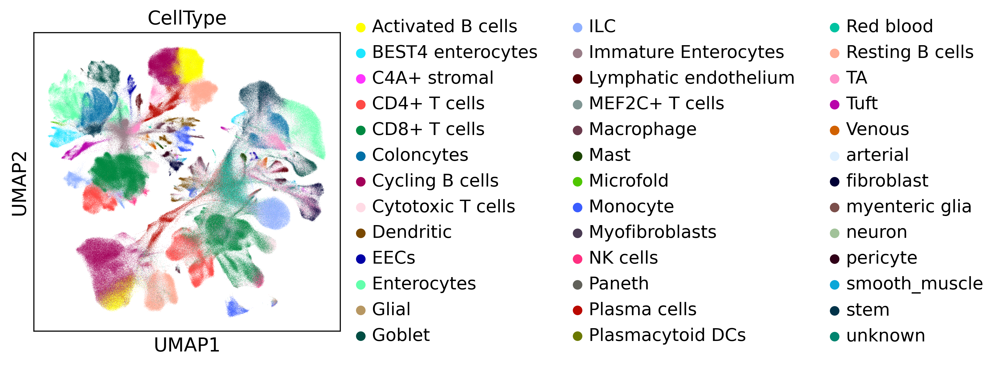

In [31]:
sc.pl.umap(full_latent_ext_first, color="CellType")

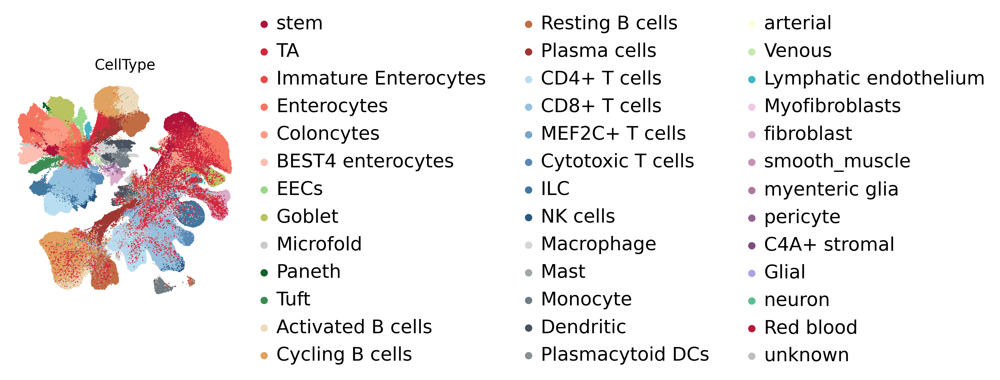

In [32]:
cell=['stem',
'TA',
'Immature Enterocytes',
'Enterocytes',
'Coloncytes',
'BEST4 enterocytes',
'EECs',
'Goblet',
'Microfold',
'Paneth',
'Tuft',
'Activated B cells',
'Cycling B cells',
'Resting B cells',
'Plasma cells',
'CD4+ T cells',
'CD8+ T cells',
'MEF2C+ T cells',
'Cytotoxic T cells',
'ILC',
'NK cells',
'Macrophage',
'Mast',
'Monocyte',
'Dendritic',
'Plasmacytoid DCs',
'arterial',
'Venous',
'Lymphatic endothelium',
'Myofibroblasts',
'fibroblast',
'smooth_muscle',
'myenteric glia',
'pericyte',
'C4A+ stromal',
'Glial',
'neuron',
'Red blood',
'unknown']
full_latent_ext_first.obs['CellType']=pd.Categorical(full_latent_ext_first.obs['CellType'],categories=cell)
colors=['#AE123AFF', '#D1283DFF', '#EA4C47FF', '#F67561FF', '#FB9B86FF', '#FFBEB2FF','#99D789FF','#B9C362FF','#CACACAFF','#09622AFF','#3B8C52FF',
 '#eedbbd','#e1a25f','#c26c43','#9f3632',
 '#b9ddf1','#94c1e0','#75a6cb','#5889b6','#42779e','#2a5783',
 '#d5d5d5','#a1a7a9','#707c83','#49525e', '#879195',
 '#FEFFD9FF', '#C4EAB1FF', '#41B7C4FF' ,
 '#eec9e5','#dbaccc','#c692b4','#af799f','#91648f','#7c4d79',
 '#aca4e2','#5cbd92',
 '#b9173a','#BEBEBE']
sc.pl.umap(full_latent_ext_first,color='CellType',palette=colors,legend_fontsize=18, legend_fontweight='bold', title='CellType',size=5,frameon=False)

In [33]:
cols_old = full_latent_ext_first.uns["CellType_colors"]
cols_new = {
    ct: col
    for ct, col in zip(
        full_latent_ext_first.obs.CellType.cat.categories, cols_old
    )
}

In [34]:
cols_new["Extended atlas"] = "#BEBEBE"

In [35]:
# full_latent_ext_first.obs.CellType = (
#     full_latent_ext_first.obs.CellType.tolist()
# )
full_latent_ext_first.obs['CellType'] = full_latent_ext_first.obs['CellType'].cat.add_categories(['Extended atlas'])
full_latent_ext_first.obs.loc[
    full_latent_ext_first.obs.ref_or_query == "query", "CellType"
] = "Extended atlas"
# full_latent_ext_first.obs.loc[
#     pd.isnull(full_latent_ext_first.obs.CellType), "CellType"
# ] = "Extended atlas"

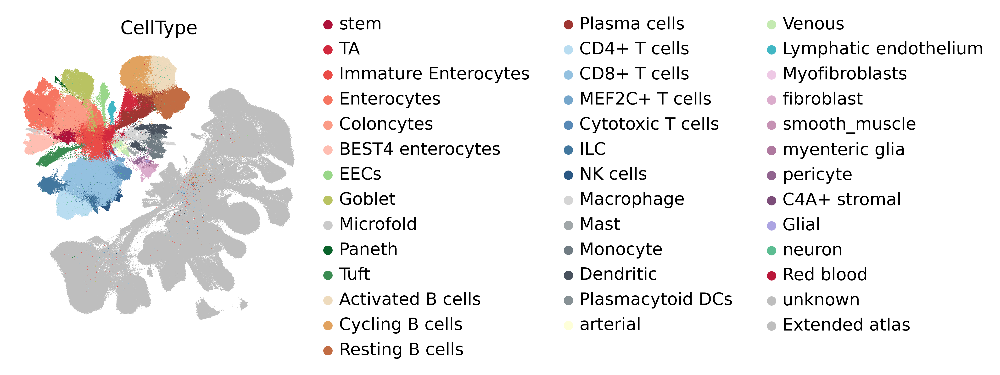

In [36]:
umap_ext_atlas = sc.pl.umap(
    full_latent_ext_first,
    color="CellType",
    palette=cols_new,
    frameon=False,
    size=1,
    return_fig=True,
)

test one data

In [38]:
pip show scanpy

Name: scanpy
Version: 1.10.4
Summary: Single-Cell Analysis in Python.
Home-page: https://scanpy.org
Author: Alex Wolf, Philipp Angerer, Fidel Ramirez, Isaac Virshup, Sergei Rybakov, Gokcen Eraslan, Tom White, Malte Luecken, Davide Cittaro, Tobias Callies, Marius Lange, Andrés R. Muñoz-Rojas
Author-email: 
License-Expression: BSD-3-Clause
Location: /disk221/software/miniconda3/envs/labBase/lib/python3.11/site-packages
Requires: anndata, h5py, joblib, legacy-api-wrap, matplotlib, natsort, networkx, numba, numpy, packaging, pandas, patsy, pynndescent, scikit-learn, scipy, seaborn, session-info, statsmodels, tqdm, umap-learn
Required-by: celltypist, infercnvpy, muon, scanet, scArches, scdrs
Note: you may need to restart the kernel to use updated packages.


In [42]:
subcore=sc.pp.subsample(core, fraction=0.1,copy=True)

In [45]:
query_ap['CRA018161']

AnnData object with n_obs × n_vars = 40031 × 3539
    obs: 'doublet_score', 'predicted_doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'project', 'S_score', 'G2M_score', 'phase', '_scvi_batch', '_scvi_labels', 'leiden', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'leiden_1.0', 'Dataset', 'segment', 'stage', 'age', 'weaned', 'disease', 'gender', 'region', 'breed', 'platform', 'sequence_method', 'Project', 'CellType', 'ref_or_query', 'CellType_transferred', 'CellType_transferred_uncert'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'hvg', 'leiden', 'leiden_1.0', 'leiden_1.0_colors', 'leiden_colors', 'log1p', 'majority_voting_colors', 'neighbors', 'pca', 'predicted_labels_colors', 'project_colors', 'umap'
    obsm: 'X_pca', 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', 'X_scanvi_emb

In [46]:
test = core.concatenate(query_ap['CRA018161'], index_unique=None) 

/tmp/ipykernel_2108751/3245830044.py:1: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  test = core.concatenate(query_ap['CRA018161'], index_unique=None)


In [48]:
test.obs['CellType_transferred_uncert']=test.obs['CellType_transferred_uncert'].astype(float)

In [49]:
test_latent = sc.AnnData(X=test.obsm['X_scanvi_emb'], obs=test.obs)

In [50]:
sc.pp.neighbors(test_latent, n_neighbors=30, use_rep="X")

In [51]:
sc.tl.umap(test_latent)
test_latent_ext_first = test_latent[
    test_latent.obs.loc[test_latent.obs.ref_or_query != "ref", :].index.tolist()
    + test_latent.obs.loc[
        test_latent.obs.ref_or_query == "ref", :
    ].index.tolist(),
    :,
].copy()

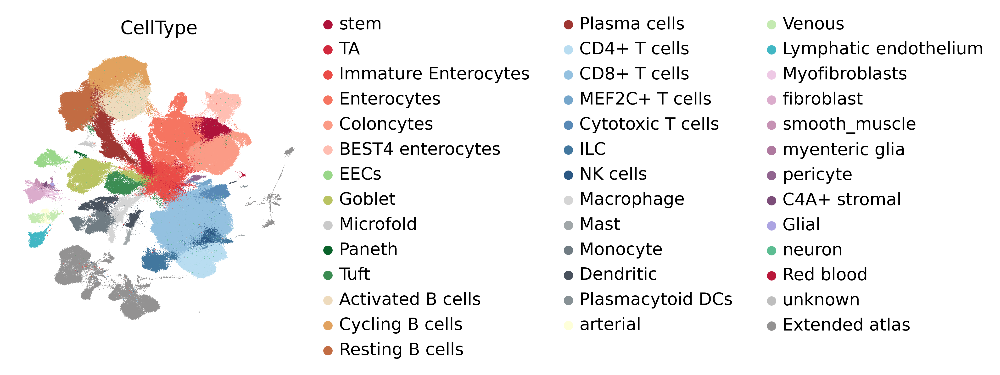

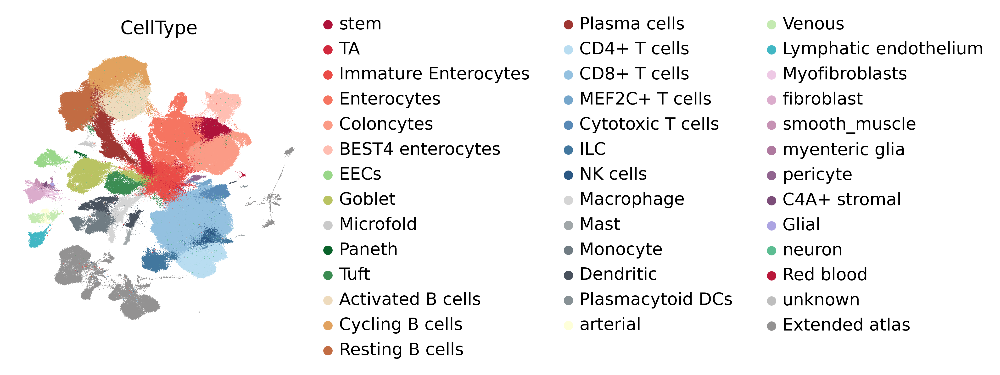

In [ ]:
cell=['stem',
'TA',
'Immature Enterocytes',
'Enterocytes',
'Coloncytes',
'BEST4 enterocytes',
'EECs',
'Goblet',
'Microfold',
'Paneth',
'Tuft',
'Activated B cells',
'Cycling B cells',
'Resting B cells',
'Plasma cells',
'CD4+ T cells',
'CD8+ T cells',
'MEF2C+ T cells',
'Cytotoxic T cells',
'ILC',
'NK cells',
'Macrophage',
'Mast',
'Monocyte',
'Dendritic',
'Plasmacytoid DCs',
'arterial',
'Venous',
'Lymphatic endothelium',
'Myofibroblasts',
'fibroblast',
'smooth_muscle',
'myenteric glia',
'pericyte',
'C4A+ stromal',
'Glial',
'neuron',
'Red blood',
'unknown']
test_latent_ext_first.obs['CellType']=pd.Categorical(test_latent_ext_first.obs['CellType'],categories=cell)
colors=['#AE123AFF', '#D1283DFF', '#EA4C47FF', '#F67561FF', '#FB9B86FF', '#FFBEB2FF','#99D789FF','#B9C362FF','#CACACAFF','#09622AFF','#3B8C52FF',
 '#eedbbd','#e1a25f','#c26c43','#9f3632',
 '#b9ddf1','#94c1e0','#75a6cb','#5889b6','#42779e','#2a5783',
 '#d5d5d5','#a1a7a9','#707c83','#49525e', '#879195',
 '#FEFFD9FF', '#C4EAB1FF', '#41B7C4FF' ,
 '#eec9e5','#dbaccc','#c692b4','#af799f','#91648f','#7c4d79',
 '#aca4e2','#5cbd92',
 '#b9173a','#BEBEBE']
cols_new["Extended atlas"] = "#939292FF"
test_latent_ext_first.obs['CellType'] = test_latent_ext_first.obs['CellType'].cat.add_categories(['Extended atlas'])
test_latent_ext_first.obs.loc[
    test_latent_ext_first.obs.ref_or_query == "query", "CellType"
] = "Extended atlas"
sc.pl.umap(
    test_latent_ext_first,
    color="CellType",
    palette=cols_new,
    frameon=False,
    size=1
)

使用scANVI去批次试试看

In [2]:
adata_full=sc.read_h5ad('/disk212/yupf/database/scRNA-seq/NewAtlas/IPGCA_Extend/IPGCA_extend_train_full.h5ad')

In [3]:
adata_full

AnnData object with n_obs × n_vars = 1205658 × 3539
    obs: 'doublet_score', 'predicted_doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'phase', '_scvi_batch', '_scvi_labels', 'leiden', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'Lineage', 'CellType', 'lym', 'level3', 'Dataset', 'segment', 'stage', 'weaned', 'Disease', 'gender', 'region', 'breed', 'project', 'age', 'ref_or_query', 'leiden_1.0', 'disease', 'platform', 'sequence_method', 'Project', 'CellType_transferred', 'CellType_transferred_uncert', 'batch'
    var: 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'highly_variable_nbatches-0', 'highly_variable_intersection-0', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'highly_variable_nbatches-1', 'highly_variable_intersection-1', 'highly_variable-2', 'means-2', 'dispersions-2', 'dispersions_norm-2', 'highly_variable_nbatches-2', 'highl

In [4]:
adata_full=adata_full.raw.to_adata()

In [5]:
adata_full

AnnData object with n_obs × n_vars = 1205658 × 19087
    obs: 'doublet_score', 'predicted_doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'phase', '_scvi_batch', '_scvi_labels', 'leiden', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'Lineage', 'CellType', 'lym', 'level3', 'Dataset', 'segment', 'stage', 'weaned', 'Disease', 'gender', 'region', 'breed', 'project', 'age', 'ref_or_query', 'leiden_1.0', 'disease', 'platform', 'sequence_method', 'Project', 'CellType_transferred', 'CellType_transferred_uncert', 'batch'
    obsm: 'X_scVI', 'X_scanvi_emb', 'X_umap', '_scvi_extra_categorical_covs'

In [6]:
adata_full.obs['project']

AAACCCAAGAGTTGAT-1_CNP0002165                  CNP0002165
AAACCCAAGCAACTTC-1_CNP0002165                  CNP0002165
AAACCCAAGCAGTCTT-1_CNP0002165                  CNP0002165
AAACCCAAGCGCATCC-1_CNP0002165                  CNP0002165
AAACCCAAGGGTAGCT-1_CNP0002165                  CNP0002165
                                                ...      
ACCACGATTGCCATTCCGAGTATG_CRR773959_M790    CRR773959_M790
ATGCCTGTCTAGGTGATCTGAGAG_CRR773959_M790    CRR773959_M790
AGCACTTCCTATCGCATTGACAGG_CRR773959_M790    CRR773959_M790
TGGCATGTCGTTATGCCTTCGTTC_CRR773959_M790    CRR773959_M790
GATCGAGTCCGACTATTGGTCCTT_CRR773959_M790    CRR773959_M790
Name: project, Length: 1205658, dtype: category
Categories (144, object): ['CNP0002165', 'CRR773953_F30', 'CRR773954_M30', 'CRR773955_F42', ..., 'Ss_CO', 'Ss_DU', 'Ss_IL', 'Ss_JE']

In [10]:
vae_epochs = 500
condition_key='project'
cell_type_key='CellType'
unlabeled_category='unknown'
early_stopping_kwargs_scanvi = {
    "early_stopping": True,  # 启用早停机制
    "early_stopping_monitor": "elbo_validation",  # 监控的指标
    "early_stopping_min_delta": 0.001,  # 最小改进阈值
    "early_stopping_patience": 10,  # 耐心值
    "early_stopping_mode": "min",  # 模式（因为 ELBO 是越小越好）
    "early_stopping_warmup_epochs": 0,  # 热身周期
}

In [ ]:
sca.models.SCANVI.setup_anndata(adata_full, batch_key='project', labels_key='CellType',unlabeled_category='unknown')

In [13]:
vae = sca.models.SCANVI(
    adata_full,
    unlabeled_category,
    n_layers=2,
    n_latent = 30, # to allow for capturing more heterogeneity
    encode_covariates=True,
    deeply_inject_covariates=False,
    use_layer_norm="both",
    use_batch_norm="none",
    gene_likelihood="nb", # because we have UMI data
)

In [14]:
print("Labelled Indices: ", len(vae._labeled_indices))
print("Unlabelled Indices: ", len(vae._unlabeled_indices))

Labelled Indices:  1171751
Unlabelled Indices:  33907


In [15]:
vae.train(
    max_epochs=vae_epochs,
    check_val_every_n_epoch=1,
    **early_stopping_kwargs_scanvi
)

INFO     Training for 500 epochs.                                                                                  


INFO: Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
INFO:lightning.pytorch.utilities.rank_zero:Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
/disk221/software/miniconda3/envs/labBase/lib/python3.11/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /disk221/software/miniconda3/envs/labBase/lib/python ...
INFO: GPU available: True (cuda)

Training:   0%|          | 0/500 [00:00<?, ?it/s]

Monitored metric elbo_validation did not improve in the last 10 records. Best score: 4627.737. Signaling Trainer to stop.


In [17]:
vae.save('/disk212/yupf/database/scRNA-seq/NewAtlas/IPGCA_Extend/IPGCA_ALL_model', overwrite=False)

In [40]:
reference_latent = sc.AnnData(vae.get_latent_representation())
reference_latent.obs.index = adata_full.obs.index

In [41]:
reference_latent.obs=adata_full.obs

In [42]:
reference_latent

AnnData object with n_obs × n_vars = 1205658 × 30
    obs: 'doublet_score', 'predicted_doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'phase', '_scvi_batch', '_scvi_labels', 'leiden', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'Lineage', 'CellType', 'lym', 'level3', 'Dataset', 'segment', 'stage', 'weaned', 'Disease', 'gender', 'region', 'breed', 'project', 'age', 'ref_or_query', 'leiden_1.0', 'disease', 'platform', 'sequence_method', 'Project', 'CellType_transferred', 'CellType_transferred_uncert', 'batch'

In [23]:
sc.pp.neighbors(reference_latent, n_neighbors=30, use_rep="X")
sc.tl.umap(reference_latent)

In [35]:
reference_latent = reference_latent[
    reference_latent.obs.loc[reference_latent.obs.ref_or_query != "ref", :].index.tolist()
    + reference_latent.obs.loc[
        reference_latent.obs.ref_or_query == "ref", :
    ].index.tolist(),
    :,
].copy()

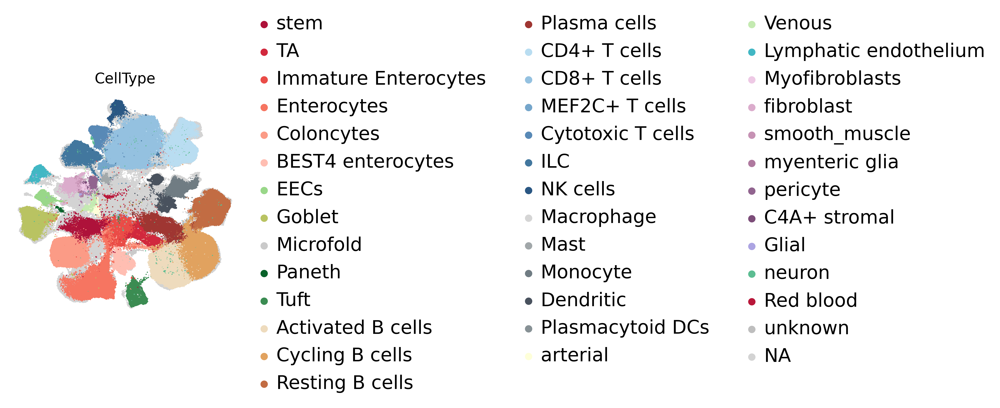

In [36]:
cell=['stem',
'TA',
'Immature Enterocytes',
'Enterocytes',
'Coloncytes',
'BEST4 enterocytes',
'EECs',
'Goblet',
'Microfold',
'Paneth',
'Tuft',
'Activated B cells',
'Cycling B cells',
'Resting B cells',
'Plasma cells',
'CD4+ T cells',
'CD8+ T cells',
'MEF2C+ T cells',
'Cytotoxic T cells',
'ILC',
'NK cells',
'Macrophage',
'Mast',
'Monocyte',
'Dendritic',
'Plasmacytoid DCs',
'arterial',
'Venous',
'Lymphatic endothelium',
'Myofibroblasts',
'fibroblast',
'smooth_muscle',
'myenteric glia',
'pericyte',
'C4A+ stromal',
'Glial',
'neuron',
'Red blood',
'unknown']
reference_latent.obs['CellType']=pd.Categorical(reference_latent.obs['CellType'],categories=cell)
colors=['#AE123AFF', '#D1283DFF', '#EA4C47FF', '#F67561FF', '#FB9B86FF', '#FFBEB2FF','#99D789FF','#B9C362FF','#CACACAFF','#09622AFF','#3B8C52FF',
 '#eedbbd','#e1a25f','#c26c43','#9f3632',
 '#b9ddf1','#94c1e0','#75a6cb','#5889b6','#42779e','#2a5783',
 '#d5d5d5','#a1a7a9','#707c83','#49525e', '#879195',
 '#FEFFD9FF', '#C4EAB1FF', '#41B7C4FF' ,
 '#eec9e5','#dbaccc','#c692b4','#af799f','#91648f','#7c4d79',
 '#aca4e2','#5cbd92',
 '#b9173a','#BEBEBE']
sc.pl.umap(reference_latent,color='CellType',palette=colors,legend_fontsize=18, legend_fontweight='bold', title='CellType',size=5,frameon=False)

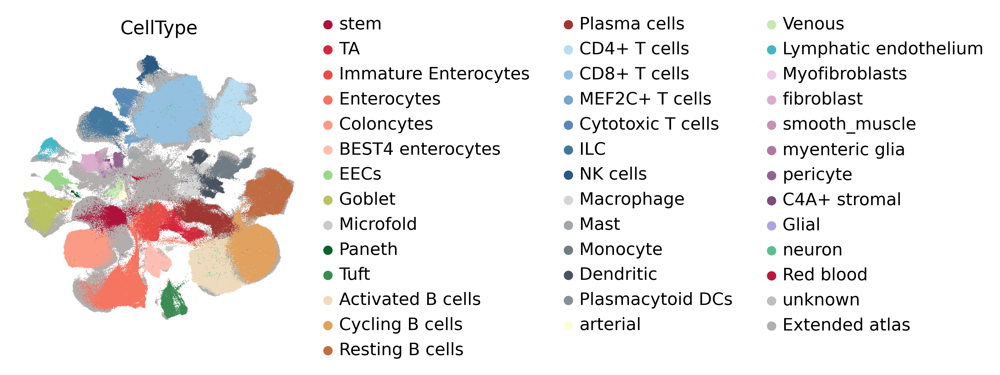

In [39]:
# cols_old = reference_latent.uns["CellType_colors"]
# cols_new = {
#     ct: col
#     for ct, col in zip(
#         reference_latent.obs.CellType.cat.categories, cols_old
#     )
# }
cols_new["Extended atlas"] = "#B1AEAEFF"
# reference_latent.obs['CellType'] = reference_latent.obs['CellType'].cat.add_categories(['Extended atlas'])
# reference_latent.obs.loc[
#     reference_latent.obs.ref_or_query == "query", "CellType"
# ] = "Extended atlas"
umap_ext_atlas = sc.pl.umap(
    reference_latent,
    color="CellType",
    palette=cols_new,
    frameon=False,
    size=1,
    return_fig=True,
)

umap_ext_atlas.savefig("/disk212/yupf/database/scRNA-seq/NewAtlas/IPGCA_Extend/Figures/umap_ext_atlas.pdf", dpi=300, bbox_inches="tight")

#### planB ：celltypist+scANVI

In [4]:
adata_ref=sc.read_h5ad('/disk212/yupf/database/scRNA-seq/NewAtlas/atlas_level3_v3.h5ad')
adata_query=sc.read_h5ad('/disk212/yupf/database/scRNA-seq/NewAtlas/IPGCA_Extend/celltypist_data/extend_conf08.h5ad')

In [5]:
ap={}
ap['ref'] = adata_ref
ap['query'] = adata_query

In [7]:
adata_full=sc.concat(ap.values(),keys=ap.keys(),label='ref_or_query',join='outer')
adata_full

AnnData object with n_obs × n_vars = 1074127 × 25497
    obs: 'doublet_score', 'predicted_doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'phase', '_scvi_batch', '_scvi_labels', 'leiden', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'Lineage', 'CellType', 'lym', 'level3', 'Dataset', 'segment', 'stage', 'weaned', 'Disease', 'gender', 'region', 'breed', 'project', 'age', 'leiden_1.0', 'disease', 'platform', 'sequence_method', 'Project', 'leiden_lineage', 'ref_or_query'
    obsm: 'X_scVI', 'X_tsne', 'X_umap', '_scvi_extra_categorical_covs', 'X_pca'

In [8]:
adata_full.obs['project']

AAACCCAAGAGTTGAT-1_CNP0002165                  CNP0002165
AAACCCAAGCAACTTC-1_CNP0002165                  CNP0002165
AAACCCAAGCAGTCTT-1_CNP0002165                  CNP0002165
AAACCCAAGCGCATCC-1_CNP0002165                  CNP0002165
AAACCCAAGGGTAGCT-1_CNP0002165                  CNP0002165
                                                ...      
TGCTTCCACTCTACTCACGGTCTT_CRR773958_F790    CRR773958_F790
TGAAGACGCGCTAGTATTAGGTCG_CRR773958_F790    CRR773958_F790
ACTCTCGAAGTGCAGTGCCAGTAT_CRR773958_F790    CRR773958_F790
AAGCACTGTGCCATTCGCACGTAA_CRR773958_F790    CRR773958_F790
GCAAGATCCTAGGTGACTACAGTG_CRR773959_M790    CRR773959_M790
Name: project, Length: 1074127, dtype: category
Categories (144, object): ['CNP0002165', 'CRR773953_F30', 'CRR773954_M30', 'CRR773955_F42', ..., 'Ss_CO', 'Ss_DU', 'Ss_IL', 'Ss_JE']

In [2]:
# adata_full.write('/disk212/yupf/database/scRNA-seq/NewAtlas/IPGCA_Extend/celltypist_data/IPGCA_All_concat.h5ad')
adata_full=sc.read_h5ad('/disk212/yupf/database/scRNA-seq/NewAtlas/IPGCA_Extend/celltypist_data/IPGCA_All_concat.h5ad')

In [3]:
vae_epochs = 500
condition_key='project'
cell_type_key='CellType'
unlabeled_category='unknown'
early_stopping_kwargs_scanvi = {
    "early_stopping": True,  # 启用早停机制
    "early_stopping_monitor": "elbo_validation",  # 监控的指标
    "early_stopping_min_delta": 0.001,  # 最小改进阈值
    "early_stopping_patience": 10,  # 耐心值
    "early_stopping_mode": "min",  # 模式（因为 ELBO 是越小越好）
    "early_stopping_warmup_epochs": 0,  # 热身周期
}

In [4]:
sca.models.SCANVI.setup_anndata(adata_full, batch_key='project', labels_key='CellType',unlabeled_category='unknown')

/disk221/software/miniconda3/envs/labBase/lib/python3.11/site-packages/scvi/data/fields/_base_field.py:63: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)


In [5]:
vae = sca.models.SCANVI(
    adata_full,
    unlabeled_category,
    n_layers=2,
    n_latent = 30, # to allow for capturing more heterogeneity
    encode_covariates=True,
    deeply_inject_covariates=False,
    use_layer_norm="both",
    use_batch_norm="none",
    gene_likelihood="nb", # because we have UMI data
)

In [6]:
print("Labelled Indices: ", len(vae._labeled_indices))
print("Unlabelled Indices: ", len(vae._unlabeled_indices))

Labelled Indices:  1074127
Unlabelled Indices:  0


In [7]:
vae.train(
    max_epochs=vae_epochs,
    check_val_every_n_epoch=1,
    **early_stopping_kwargs_scanvi
)

INFO     Training for 500 epochs.                                                                                  


INFO: Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
INFO:lightning.pytorch.utilities.rank_zero:Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
/disk221/software/miniconda3/envs/labBase/lib/python3.11/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /disk221/software/miniconda3/envs/labBase/lib/python ...
INFO: GPU available: True (cuda)

Training:   0%|          | 0/500 [00:00<?, ?it/s]

Monitored metric elbo_validation did not improve in the last 10 records. Best score: 4693.149. Signaling Trainer to stop.


In [9]:
vae.save('/disk212/yupf/database/scRNA-seq/NewAtlas/IPGCA_Extend/celltypist_data/model', overwrite=False)

In [10]:
reference_latent = sc.AnnData(vae.get_latent_representation())
reference_latent.obs.index = adata_full.obs.index

In [11]:
reference_latent.obs=adata_full.obs

In [12]:
reference_latent

AnnData object with n_obs × n_vars = 1074127 × 30
    obs: 'doublet_score', 'predicted_doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'phase', '_scvi_batch', '_scvi_labels', 'leiden', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'Lineage', 'CellType', 'lym', 'level3', 'Dataset', 'segment', 'stage', 'weaned', 'Disease', 'gender', 'region', 'breed', 'project', 'age', 'leiden_1.0', 'disease', 'platform', 'sequence_method', 'Project', 'leiden_lineage', 'ref_or_query'

In [13]:
sc.pp.neighbors(reference_latent, n_neighbors=30, use_rep="X")
sc.tl.umap(reference_latent)

In [14]:
reference_latent = reference_latent[
    reference_latent.obs.loc[reference_latent.obs.ref_or_query != "ref", :].index.tolist()
    + reference_latent.obs.loc[
        reference_latent.obs.ref_or_query == "ref", :
    ].index.tolist(),
    :,
].copy()

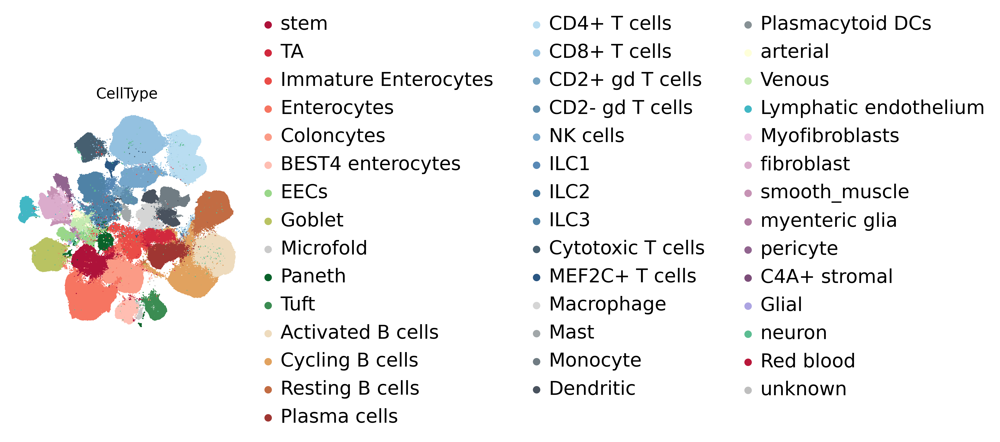

In [15]:
cell=['stem',
'TA',
'Immature Enterocytes',
'Enterocytes',
'Coloncytes',
'BEST4 enterocytes',
'EECs',
'Goblet',
'Microfold',
'Paneth',
'Tuft',
'Activated B cells',
'Cycling B cells',
'Resting B cells',
'Plasma cells',
'CD4+ T cells',
'CD8+ T cells',
'CD2+ gd T cells',
'CD2- gd T cells',
'NK cells',
'ILC1',
'ILC2',
'ILC3',
'Cytotoxic T cells',
'MEF2C+ T cells',
'Macrophage',
'Mast',
'Monocyte',
'Dendritic',
'Plasmacytoid DCs',
'arterial',
'Venous',
'Lymphatic endothelium',
'Myofibroblasts',
'fibroblast',
'smooth_muscle',
'myenteric glia',
'pericyte',
'C4A+ stromal',
'Glial',
'neuron',
'Red blood',
'unknown']
reference_latent.obs['CellType']=pd.Categorical(reference_latent.obs['CellType'],categories=cell)
colors=['#AE123AFF', '#D1283DFF', '#EA4C47FF', '#F67561FF', '#FB9B86FF', '#FFBEB2FF','#99D789FF','#B9C362FF','#CACACAFF','#09622AFF','#3B8C52FF',
 '#eedbbd','#e1a25f','#c26c43','#9f3632',
 '#b9ddf1','#94c1e0','#75A3C2FF','#5E8DADFF','#75a6cb','#5889b6','#42779e','#4F82A6FF','#465F70FF','#2a5783',
 '#d5d5d5','#a1a7a9','#707c83','#49525e', '#879195',
 '#FEFFD9FF', '#C4EAB1FF', '#41B7C4FF' ,
 '#eec9e5','#dbaccc','#c692b4','#af799f','#91648f','#7c4d79',
 '#aca4e2','#5cbd92',
 '#b9173a','#BEBEBE']
sc.pl.umap(reference_latent,color='CellType',palette=colors,legend_fontsize=18, legend_fontweight='bold', title='CellType',size=5,frameon=False)

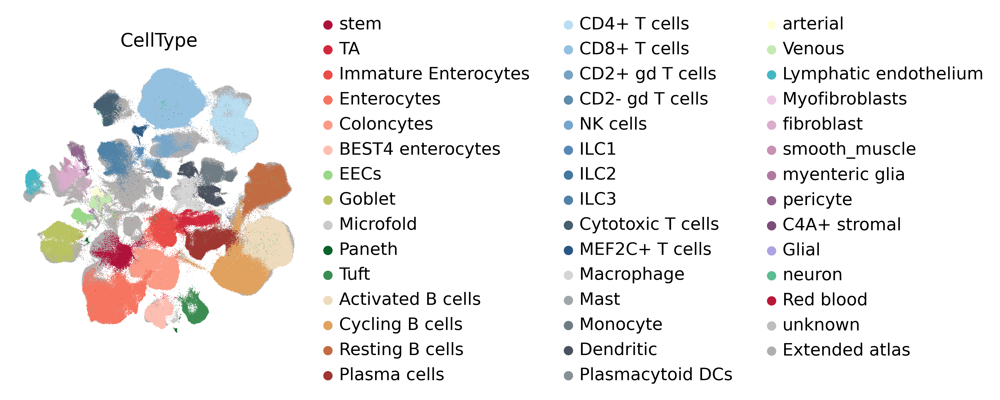

In [16]:
cols_old = reference_latent.uns["CellType_colors"]
cols_new = {
    ct: col
    for ct, col in zip(
        reference_latent.obs.CellType.cat.categories, cols_old
    )
}
cols_new["Extended atlas"] = "#B1AEAEFF"
reference_latent.obs['CellType'] = reference_latent.obs['CellType'].cat.add_categories(['Extended atlas'])
reference_latent.obs.loc[
    reference_latent.obs.ref_or_query == "query", "CellType"
] = "Extended atlas"
umap_ext_atlas = sc.pl.umap(
    reference_latent,
    color="CellType",
    palette=cols_new,
    frameon=False,
    size=1,
    return_fig=True,
)

umap_ext_atlas.savefig("/disk212/yupf/database/scRNA-seq/NewAtlas/IPGCA_Extend/Figures/umap_ext_atlas2.pdf", dpi=300, bbox_inches="tight")

In [17]:
reference_latent

AnnData object with n_obs × n_vars = 1074127 × 30
    obs: 'doublet_score', 'predicted_doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'phase', '_scvi_batch', '_scvi_labels', 'leiden', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'Lineage', 'CellType', 'lym', 'level3', 'Dataset', 'segment', 'stage', 'weaned', 'Disease', 'gender', 'region', 'breed', 'project', 'age', 'leiden_1.0', 'disease', 'platform', 'sequence_method', 'Project', 'leiden_lineage', 'ref_or_query'
    uns: 'neighbors', 'umap', 'CellType_colors'
    obsm: 'X_umap'
    obsp: 'distances', 'connectivities'

In [39]:
reference_latent.write('/disk212/yupf/database/scRNA-seq/NewAtlas/IPGCA_Extend/celltypist_data/IPGCA_All_latent.h5ad')